<a href="https://colab.research.google.com/github/rsnatorres/analise_dados_ramon/blob/main/2023_08_analise_dados_netimoveis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Loading Libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import unidecode
import plotly.express as px
import pyproj
import difflib

In [ ]:
import re

In [ ]:
#!pip install geopandas
#!pip install unidecode

## 0.1 Setting configs

In [ ]:
pd.set_option('display.max_columns', None) # para o pandas mostrar todas as colunas do dataframe(df)

## 0.2 Setting ambient vars

In [ ]:
COMPUTADOR = 'lenovo'
if COMPUTADOR == 'lenovo':
    dir_onedrive = r'C:\Users\Lord-\OneDrive'
else:
    dir_onedrive = r'D:\OneDrive'

In [ ]:
dir_onedrive

'C:\\Users\\Lord-\\OneDrive'

In [ ]:
dir_consultoria = rf'{dir_onedrive}\0 - Torres Consultoria\As Consultorias\202307 - Praxis - Rel Merc Imob - Lagoa Santa (2)'

# 1. Loading Data

## 1.1 Sell

In [ ]:
df = pd.DataFrame()

for dir_mes_name in ['202206', '202207', '202208', '202209', '202210', '202211', '202212',
                    '202301', '202302', '202303', '202304', '202305', '202306']:
    print(dir_mes_name)
    path_venda = rf'{dir_onedrive}\0 - Torres Consultoria\projetos\Crawlers projects\storage_netimoveis\{dir_mes_name}\dados_netimoveis_venda.csv'
    df_venda = pd.read_csv(path_venda,
                 sep=';')
    df_venda.columns = df_venda.columns.str.strip()
    df = pd.concat([df, df_venda])

202206
202207
202208
202209
202210
202211
202212
202301
202302
202303
202304
202305
202306


## 1.2 Rent

In [ ]:
#path_aluguel = fr'{dir_onedrive}\0 - Torres Consultoria\projetos\Crawlers projects\storage_netimoveis\202306\dados_netimoveis_aluguel.csv'
#df_aluguel = pd.read_csv(path_aluguel,
#                 sep=';')
#df_aluguel.columns = df_aluguel.columns.str.strip()
#df = pd.concat([df, df_aluguel])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 915468 entries, 0 to 72919
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   venda ou aluguel    915468 non-null  object
 1   today               915468 non-null  object
 2   estado              915468 non-null  object
 3   page                915468 non-null  int64 
 4   title               915468 non-null  object
 5   construcao          915468 non-null  object
 6   endereco            915315 non-null  object
 7   metragem            915468 non-null  object
 8   quartos             915468 non-null  object
 9   vagas               915468 non-null  object
 10  banhos              915468 non-null  object
 11  ultima_atualizacao  915468 non-null  object
 12  valor               915468 non-null  object
 13  condominio          915468 non-null  object
 14  codigo              915468 non-null  int64 
 15  link                915468 non-null  object
dtypes: int64

# 2.Transformation

In [ ]:
#verificando duplicados pelo código
len(df), df.codigo.nunique() # nº de imoveis x nº de imóveis únicos --> há muitos duplicados

(915468, 68555)

In [ ]:
# selecionando valores únicos --> regra: vale o primeiro que aparecer
# definindo novo dataframe sem duplicadas
df = df.drop_duplicates(subset=['venda ou aluguel', 'today', 'codigo'], keep='first')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 528222 entries, 0 to 72918
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   venda ou aluguel    528222 non-null  object
 1   today               528222 non-null  object
 2   estado              528222 non-null  object
 3   page                528222 non-null  int64 
 4   title               528222 non-null  object
 5   construcao          528222 non-null  object
 6   endereco            528162 non-null  object
 7   metragem            528222 non-null  object
 8   quartos             528222 non-null  object
 9   vagas               528222 non-null  object
 10  banhos              528222 non-null  object
 11  ultima_atualizacao  528222 non-null  object
 12  valor               528222 non-null  object
 13  condominio          528222 non-null  object
 14  codigo              528222 non-null  int64 
 15  link                528222 non-null  object
dtypes: int64

In [ ]:
df.reset_index(inplace=True)
df.drop('index', axis=1, inplace=True)

## 2.1 Strings

In [ ]:
# cabeçalhos
df.rename(columns={'metragem':'area',
                   'venda ou aluguel': 'venda_ou_aluguel'}, inplace=True)

In [ ]:
# tipologia: casa, apartamento, etc
df['title'].value_counts()

title
Casa à venda, 360m²                       9336
Terreno à venda, 360m²                    5947
Apartamento 2 quartos à venda, 45m²       3882
Apartamento 2 quartos à venda, 50m²       3404
Apartamento 2 quartos à venda, 60m²       3371
                                          ... 
Apartamento 2 quartos à venda, 92,51m²       1
Apartamento 2 quartos à venda, 67,87m²       1
Prédio à venda, 4.500m²                      1
Apartamento 1 quarto à venda, 63,88m²        1
Chácara à venda, 2.500,2m²                   1
Name: count, Length: 20953, dtype: int64

### 2.1.1 Extracting Tipology

In [ ]:
df['tipo'] = df.title.str.split(' ', expand = True)[0]
df['tipo'].value_counts().head() # todos

tipo
Apartamento    262118
Casa           129172
Terreno         64715
Sala            18943
Loja             9164
Name: count, dtype: int64

In [ ]:
# ajuste nos links
df['link'] = 'https://www.netimoveis.com' + df['link']

## 2.2 Numerics

Condominio:
-não tem decimal nos valores de condominio

### 2.2.1 Adjusting Numerics

In [ ]:
# transformando area em números
df['area'] = df['area'].str.replace('.', '').str.replace(',', '.').str.replace('m²', '').str.replace('ha', '')
df['area'] = pd.to_numeric(df['area'], errors='coerce')
# transformando valores de venda em número
df['valor'] = df['valor'].str.replace('R', '').str.replace('$', '').str.replace('.','').str.strip()
df['valor'] = pd.to_numeric(df['valor'])
# transformando area, quartos, vagas e banhos em números
df['quartos'] = pd.to_numeric(df['quartos'], errors='coerce')
df['vagas'] = pd.to_numeric(df['vagas'], errors='coerce')
df['banhos'] = pd.to_numeric(df['banhos'], errors='coerce')
# transformando condominio em número
df['condominio'] = df['condominio'].apply(lambda x: re.sub(r'(\D+)', '', x)) # regex
df['condominio'] = pd.to_numeric(df['condominio'], errors='coerce')

# calculando valor do m²
df['valor_m2'] = (df['valor']/df['area']).round(2)

In [ ]:
# verificando quantos valores nulos há em cada uma das colunas
for i in ['area', 'quartos', 'vagas', 'banhos','condominio']:
    print(f"nº {i} nulos: {df[i].isnull().value_counts()[1]}")

nº area nulos: 148
nº quartos nulos: 126886
nº vagas nulos: 128473
nº banhos nulos: 92794
nº condominio nulos: 221122


### 2.2.2 Filtering numeric (outliers)

In [ ]:
num_cols = ['area', 'quartos', 'vagas', 'banhos', 'valor', 'condominio', 'valor_m2']

In [ ]:
df[num_cols].describe().round(2)

,area,quartos,vagas,banhos,valor,condominio,valor_m2
count,5.280740e+05,401336.00,399749.00,435428.00,5.282220e+05,221122.00,5.280740e+05
mean,7.939330e+03,2.97,4.22,2.10,8.917973e+05,860.03,6.295656e+04
std,7.400396e+05,1.60,208.39,1.57,4.540059e+06,18064.11,9.425816e+06
min,1.000000e-02,1.00,1.00,1.00,0.000000e+00,0.00,0.000000e+00
25%,6.400000e+01,2.00,1.00,1.00,2.600000e+05,200.00,2.552420e+03
50%,1.200000e+02,3.00,2.00,2.00,4.700000e+05,340.00,4.134620e+03
75%,3.000000e+02,3.00,3.00,3.00,8.900000e+05,600.00,6.263160e+03
max,1.330000e+08,60.00,32400.00,91.00,1.343250e+09,1730000.00,3.000000e+09


In [ ]:
# % de nulos por coluna
# como antes tinha '-' em quartos e vagas, n dava para saber se era ou não nulo
df.isnull().mean().round(4)*100

venda_ou_aluguel       0.00
today                  0.00
estado                 0.00
page                   0.00
title                  0.00
construcao             0.00
endereco               0.01
area                   0.03
quartos               24.02
vagas                 24.32
banhos                17.57
ultima_atualizacao     0.00
valor                  0.00
condominio            58.14
codigo                 0.00
link                   0.00
tipo                   0.00
valor_m2               0.03
dtype: float64

## 2.3 Extracting Features

Novas colunas, novas informações

### 2.3.1 Extracting adress

In [ ]:
df.head(2)

,venda_ou_aluguel,today,estado,page,title,construcao,endereco,area,quartos,vagas,banhos,ultima_atualizacao,valor,condominio,codigo,link,tipo,valor_m2
0,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 60m²",nao,"Bonsucesso, Rua Frei Paulo, 311",60.0,2.0,1.0,1.0,Atualizado hoje,140000,170.0,843406,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,2333.33
1,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 45m²",nao,"Imperial, Avenida Mário Fonseca Viana, 2330",45.0,2.0,1.0,1.0,Atualizado há mais de 3 dias,145000,189.0,853667,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,3222.22


In [ ]:
# Endereço - desmembrando variável endereço em seus três componentes e colocando no dataframe cada um
for i in df.index:
    try:
        lista_endereco = df.loc[i, 'endereco'].split(',')
        if len(lista_endereco) == 1:
            df.loc[i, 'bairro'] = lista_endereco[0]
            df.loc[i, 'rua'] = None
            df.loc[i, 'numero'] = None
        elif len(lista_endereco) ==2:
            df.loc[i, 'bairro'] = lista_endereco[0]
            df.loc[i, 'rua'] = lista_endereco[1]
            df.loc[i, 'numero'] = None
        elif len(lista_endereco) ==3:
            df.loc[i, 'bairro'] = lista_endereco[0]
            df.loc[i, 'rua'] = lista_endereco[1]
            df.loc[i, 'numero'] = lista_endereco[2]
        else:
            df.loc[i, 'endereco2'] = lista_endereco
    except Exception as e:
        print(i)
        print(df.loc[i, 'endereco'])

3795
Alphaville, Rua MG 010 Km 21,5, 4
3842
Condomínio Alameda das Águas, Avenida Alameda da Águas, Br 356, Km 33
3985
Centro, Avenida Amazonas, 491, 491
7562
Condomínio Estâncias do Estoril, Avenida Alameda da Águas, Br 356, Km 33
8613
Jardim Agenor de Lima, Rua Jardim Agenor de Lima, Rua José Dionísio Soeiro, MG
9616
Funcionários, Rua Paraíba, 1317, 1317
13836
nan
14621
nan
14935
Condomínio Alameda das Águas, Avenida Alameda da Águas, Br 356, Km 33
17355
nan
18425
nan
19218
nan
25272
nan
27015
nan
32764
nan
40073
nan
44348
Alphaville, Rua MG 010 Km 21,5, 4
44393
Condomínio Alameda das Águas, Avenida Alameda da Águas, Br 356, Km 33
48160
Condomínio Estâncias do Estoril, Avenida Alameda da Águas, Br 356, Km 33
49178
Jardim Agenor de Lima, Rua Jardim Agenor de Lima, Rua José Dionísio Soeiro, MG
50164
Funcionários, Rua Paraíba, 1317, 1317
54314
nan
55066
nan
55372
Condomínio Alameda das Águas, Avenida Alameda da Águas, Br 356, Km 33
57729
nan
58766
nan
59547
nan
65655
nan
67362
nan
73094

In [ ]:
df['bairro'].value_counts()

bairro
Centro                                     22859
Funcionários                               12014
Buritis                                    10037
Lourdes                                     8571
Serra                                       8324
                                           ...  
Clube dos Duzentos                             1
Nova Vila Bretas                               1
Serra Dourada (Parque Durval de Barros)        1
Fazenda Castro                                 1
Complementação Jardim Vila Andreza             1
Name: count, Length: 2232, dtype: int64

In [ ]:
df['bairro'] = df['bairro'].fillna('Sem bairro')

In [ ]:
df['bairro'] = df['bairro'].apply(unidecode.unidecode).str.lower()

In [ ]:
df.head(2)

,venda_ou_aluguel,today,estado,page,title,construcao,endereco,area,quartos,vagas,banhos,ultima_atualizacao,valor,condominio,codigo,link,tipo,valor_m2,bairro,rua,numero,endereco2
0,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 60m²",nao,"Bonsucesso, Rua Frei Paulo, 311",60.0,2.0,1.0,1.0,Atualizado hoje,140000,170.0,843406,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,2333.33,bonsucesso,Rua Frei Paulo,311,NaN
1,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 45m²",nao,"Imperial, Avenida Mário Fonseca Viana, 2330",45.0,2.0,1.0,1.0,Atualizado há mais de 3 dias,145000,189.0,853667,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,3222.22,imperial,Avenida Mário Fonseca Viana,2330,NaN


In [ ]:
len(df[df['bairro'] ==''] )

398

In [ ]:
# há algumas obs sem bairro
df = df[df['bairro'] !='']

### 2.3.2 Extracting Municipality

In [ ]:
gdf = gpd.read_file(fr'{dir_onedrive}\DADOS\malhas\malha_mg_leve\31MUE250GC_SIR.shp')

gdf.columns = gdf.columns.str.lower()
gdf['nm_municip'] = gdf['nm_municip'].str.lower()
mun_mg = gdf[['cd_geocodm', 'nm_municip', 'geometry']].copy()
mun_mg.columns = ['cod mun', 'nome mun', 'geometry']
mun_mg.sort_values(by='nome mun', ascending=True, inplace=True)
mun_mg['cod mun'] = pd.to_numeric(mun_mg.loc[:,'cod mun'])
mun_mg['nome mun'] = mun_mg['nome mun'].str.strip()
#mun_mg['nome mun'] = mun_mg['nome mun'].apply(lambda x: unidecode(x))
mun_mg['nome mun'] = mun_mg['nome mun'].apply(unidecode.unidecode)

In [ ]:
mun_mg.head()

,cod mun,nome mun,geometry
52,3100104,abadia dos dourados,"POLYGON ((-47.42967 -18.16543, -47.40702 -18.2..."
53,3100203,abaete,"POLYGON ((-45.18441 -18.87596, -45.11515 -18.9..."
54,3100302,abre campo,"POLYGON ((-42.49648 -20.19483, -42.44065 -20.1..."
55,3100401,acaiaca,"POLYGON ((-43.13289 -20.34066, -43.02387 -20.4..."
59,3100807,aguanil,"POLYGON ((-45.34247 -21.06877, -45.39442 -21.0..."


In [ ]:
lists_of_words = df['link'].str.split('minas-gerais-', expand=True)[1].str.split('-').copy()
lists_of_words

0                          [vespasiano, bonsucesso/843406/]
1         [vespasiano, imperial/853667/?tipoUrl=apartame...
2         [belo, horizonte, centro, sul, santa, efigenia...
3             [belo, horizonte, nordeste, silveira/471037/]
4         [belo, horizonte, centro, sul, carmo/601303/?t...
                                ...                        
528217        [belo, horizonte, barreiro, barreiro/780033/]
528218    [jaboticatubas, parque, das, aguas, de, serra,...
528219    [pedro, leopoldo, centro/430753/?tipoUrl=casa,...
528220    [confins, centro/774999/?tipoUrl=chacara&bairr...
528221    [belo, horizonte, venda, nova, venda, nova/510...
Name: 1, Length: 527824, dtype: object

In [ ]:
# encontrando as cidades pelo link
cities = []
for list_of_words in lists_of_words: # for each list inside the series of lists
    city = list_of_words[0] # the first word is the first condition
    for i in range(1, len(list_of_words)):
        if city in mun_mg['nome mun'].values: # if the first word is the city
            cities.append(city)
            break # if city is found the loop above must ends
        elif i == len(list_of_words)-1:
            cities.append('None')
        else:
            city += ' ' + list_of_words[i]

In [ ]:
df['link']

0         https://www.netimoveis.com/imovel/venda-aparta...
1         https://www.netimoveis.com/imovel/venda-aparta...
2         https://www.netimoveis.com/imovel/venda-sala-m...
3         https://www.netimoveis.com/imovel/venda-sala-m...
4         https://www.netimoveis.com/imovel/venda-conjun...
                                ...                        
528217    https://www.netimoveis.com/imovel/venda-lote-a...
528218    https://www.netimoveis.com/imovel/venda-casa-m...
528219    https://www.netimoveis.com/imovel/venda-casa-c...
528220    https://www.netimoveis.com/imovel/venda-chacar...
528221    https://www.netimoveis.com/imovel/venda-lote-a...
Name: link, Length: 527824, dtype: object

In [ ]:
len(df.columns)

22

In [ ]:
df.insert(len(df.columns), 'cidade', cities) # inserir nova coluna na última posição

In [ ]:
df.head(2)

,venda_ou_aluguel,today,estado,page,title,construcao,endereco,area,quartos,vagas,banhos,ultima_atualizacao,valor,condominio,codigo,link,tipo,valor_m2,bairro,rua,numero,endereco2,cidade
0,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 60m²",nao,"Bonsucesso, Rua Frei Paulo, 311",60.0,2.0,1.0,1.0,Atualizado hoje,140000,170.0,843406,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,2333.33,bonsucesso,Rua Frei Paulo,311,NaN,vespasiano
1,venda,08/06/2022,Minas Gerais,1,"Apartamento 2 quartos à venda, 45m²",nao,"Imperial, Avenida Mário Fonseca Viana, 2330",45.0,2.0,1.0,1.0,Atualizado há mais de 3 dias,145000,189.0,853667,https://www.netimoveis.com/imovel/venda-aparta...,Apartamento,3222.22,imperial,Avenida Mário Fonseca Viana,2330,NaN,vespasiano


In [ ]:
# reorganizando colunas para facilitar visualização do dataframe sai de 39953 rows para 23339 rows (58%)
df = df[['venda_ou_aluguel', 'codigo', 'tipo', 'cidade', 'bairro', 'area', 'valor', 'valor_m2', 'condominio', 'quartos', 'vagas', 'banhos',
    'ultima_atualizacao', 'link','endereco','rua', 'numero']]

In [ ]:
df.head(2)

,venda_ou_aluguel,codigo,tipo,cidade,bairro,area,valor,valor_m2,condominio,quartos,vagas,banhos,ultima_atualizacao,link,endereco,rua,numero
0,venda,843406,Apartamento,vespasiano,bonsucesso,60.0,140000,2333.33,170.0,2.0,1.0,1.0,Atualizado hoje,https://www.netimoveis.com/imovel/venda-aparta...,"Bonsucesso, Rua Frei Paulo, 311",Rua Frei Paulo,311
1,venda,853667,Apartamento,vespasiano,imperial,45.0,145000,3222.22,189.0,2.0,1.0,1.0,Atualizado há mais de 3 dias,https://www.netimoveis.com/imovel/venda-aparta...,"Imperial, Avenida Mário Fonseca Viana, 2330",Avenida Mário Fonseca Viana,2330


## 2.4 Merge geodata (only BH)


### 2.4.1 Regional + Up + bairro

Correspondencia de bairro, regional e up (feita no projeto do lincoln)

In [ ]:
df_regionais = pd.read_csv(fr'{dir_onedrive}\DADOS\bairros_regionais_ups_bh.csv')


df_regionais.columns = df_regionais.columns.str.strip().str.lower()
df_regionais.drop('unnamed: 0', axis=1, inplace=True)
for column in df_regionais.columns:
    df_regionais[column] = df_regionais[column].str.strip().str.lower()

In [ ]:
df_regionais[df_regionais['bairro'].str.contains('caic')]

,bairro,regional,up
15,caicaras,noroeste,caicara
111,caicara adelaide,noroeste,caicara
121,alto caicaras,noroeste,caicara


In [ ]:
len(df_regionais), df_regionais['bairro'].nunique()

(357, 357)

In [ ]:
df.head(2)

,venda_ou_aluguel,codigo,tipo,cidade,bairro,area,valor,valor_m2,condominio,quartos,vagas,banhos,ultima_atualizacao,link,endereco,rua,numero
0,venda,843406,Apartamento,vespasiano,bonsucesso,60.0,140000,2333.33,170.0,2.0,1.0,1.0,Atualizado hoje,https://www.netimoveis.com/imovel/venda-aparta...,"Bonsucesso, Rua Frei Paulo, 311",Rua Frei Paulo,311
1,venda,853667,Apartamento,vespasiano,imperial,45.0,145000,3222.22,189.0,2.0,1.0,1.0,Atualizado há mais de 3 dias,https://www.netimoveis.com/imovel/venda-aparta...,"Imperial, Avenida Mário Fonseca Viana, 2330",Avenida Mário Fonseca Viana,2330


In [ ]:
len(df)

527824

In [ ]:
len(df[df['cidade'] == 'belo horizonte'])

309010

In [ ]:
# p qts obs vou ter novas info se fizer o merge sem alterar nada
df[df['cidade'] == 'belo horizonte'].merge(df_regionais, how='left', on = 'bairro')['regional'].value_counts().sum()

292701

In [ ]:
#https://docs.python.org/3.8/library/difflib.html

In [ ]:
# ao inves de merge, apenas atribuir valores de regional e up segundo as palavras mais parecidas
for bairro in df['bairro'].unique():
    # qual o 'bairro' mais proximo no outro dataframe
    bairro_in_df2 = difflib.get_close_matches(bairro, df_regionais['bairro'].unique(),
                                              cutoff=0.7, # % de 'parecimento' [0,1]
                                              n=1 # numero de palavras mais proximas
                                             )
    if len(bairro_in_df2) > 0: # ou seja, encontrou algum bairro
        regional,up = (df_regionais.loc[df_regionais['bairro']==bairro_in_df2[0],['regional','up']]
                       .values.tolist()[0])
        df.loc[(df['cidade'] == 'belo horizonte')
               & (df['bairro'] == bairro), ['regional', 'up']] = regional, up

In [ ]:
# 10 mil obs há mais!
df['regional'].value_counts().sum()

300092

In [ ]:
df['regional'].value_counts().index.tolist()

['centro sul',
 'oeste',
 'pampulha',
 'noroeste',
 'nordeste',
 'leste',
 'norte',
 'venda nova',
 'barreiro']

### 2.4.2 Malha Regionais BH

In [ ]:
malha_bh_regionais = gpd.read_file(fr'{dir_onedrive}\DADOS\malhas\malha_bh_regionais\REGIONAL.shp')
malha_bh_regionais.columns = malha_bh_regionais.columns.str.lower()
malha_bh_regionais.rename(columns={'nome': 'regional'}, inplace=True)
malha_bh_regionais['regional'] = malha_bh_regionais['regional'].str.lower()
malha_bh_regionais.loc[malha_bh_regionais['regional']=='centro-sul', 'regional'] = 'centro sul'

In [ ]:
malha_bh_regionais['regional'].unique()

array(['norte', 'nordeste', 'leste', 'barreiro', 'oeste', 'pampulha',
       'venda nova', 'noroeste', 'centro sul'], dtype=object)

In [ ]:
# verificando se  todas as regionais batem entre o df e a malha
for regional in malha_bh_regionais['regional'].unique():
    print(regional in df['regional'].value_counts().index.tolist())

True
True
True
True
True
True
True
True
True


In [ ]:
malha_bh_regionais.set_index('regional', inplace=True)

In [ ]:
malha_bh_regionais.head(3)

,id_reg,cod_reg,sigla,area_km2,perimetr_m,geometry
regional,,,,,,
norte,6.0,23.0,NT,32.555,34762.823,"POLYGON ((610664.696 7810547.620, 610665.826 7..."
nordeste,4.0,21.0,NE,39.321,40951.450,"POLYGON ((617643.241 7808804.954, 617643.266 7..."
leste,3.0,20.0,LE,27.885,31621.064,"POLYGON ((614131.588 7801831.387, 614134.078 7..."


#### 2.4.2.1 Testing plots

<Axes: >

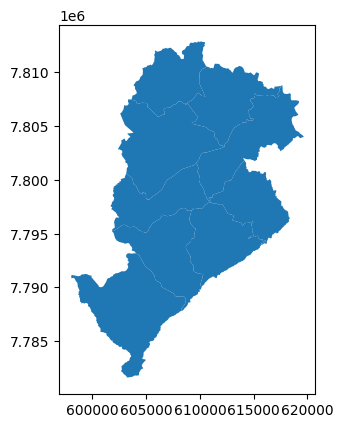

In [ ]:
malha_bh_regionais.plot()

In [ ]:
# PARA ESSA MALHA É PRECISO FAZER ESTE AJUSTE DE PROJEÇÃO
malha_bh_regionais.to_crs(pyproj.CRS.from_epsg(4326), inplace=True)

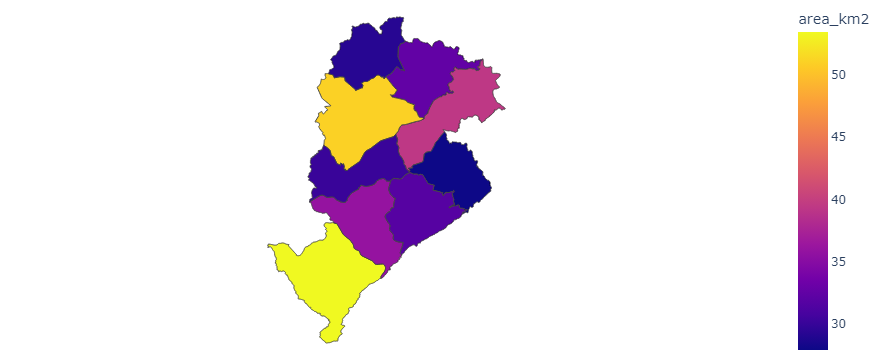

In [ ]:
# changing map style
fig = px.choropleth(malha_bh_regionais,
                     geojson = malha_bh_regionais['geometry'], # which column contains the poligons
                     color = malha_bh_regionais['area_km2'], # which value should we plot in each spatial unit (poligon)
                     locations = malha_bh_regionais.index)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) # fit map in figure
fig.show()

In [ ]:
# other styles = ['carto-positron', 'open-street-map']
fig = px.choropleth_mapbox(malha_bh_regionais,
                           geojson = malha_bh_regionais['geometry'], # which column contains the poligons
                           color = malha_bh_regionais['area_km2'], # which value should we plot in each spatial unit (poligon)
                           locations = malha_bh_regionais.index,
                           mapbox_style="open-street-map", # good to see railways
                           center={"lat": -19.91, "lon": -43.95},
                           zoom=9.8,
                           opacity=0.5)
#fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) # fit map in figure
fig.show()

# 3. Data Analysis

## 3.1 Defining a sample

### 3.1.0 Setting Amb vars

In [ ]:
CIDADE = 'lagoa santa'
VENDA_OU_ALUGUEL = 'venda'
BAIRRO = 'palmital'
TIPO = ['Apartamento', 'Casa', 'Terreno']

### 3.1.1 N-sample

In [ ]:
len(df.query("cidade == @CIDADE")), len(df)

(6064, 527824)

### 3.1.2 Tipologies

In [ ]:
df.query("cidade == @CIDADE")['tipo'].value_counts().head()

tipo
Casa           2667
Terreno        1255
Apartamento    1128
Sala            327
Loja            162
Name: count, dtype: int64

In [ ]:
df.query("cidade == @CIDADE & venda_ou_aluguel == @VENDA_OU_ALUGUEL")['tipo'].value_counts(
    normalize=True
    ).head()

tipo
Casa           0.439809
Terreno        0.206959
Apartamento    0.186016
Sala           0.053925
Loja           0.026715
Name: proportion, dtype: float64

In [ ]:
df.query("""cidade == @CIDADE \
            & venda_ou_aluguel == @VENDA_OU_ALUGUEL \
            & tipo.isin(@TIPO) \
            """)['bairro'].value_counts().head(20)

bairro
centro                             322
ipanema                            264
vale dos sonhos                    225
joa                                196
lagoa mansoes                      194
visao                              175
condominio vila arcadia            169
recanto da lagoa                   159
palmital                           159
condominio condados da lagoa       148
residencial visao                  145
vila maria                         143
estancia das amendoeiras           118
varzea                             114
lundceia                            97
vila rica                           91
metropolitan business center ii     90
estancia anturios                   77
jardim imperial                     74
lundcea                             74
Name: count, dtype: int64

In [ ]:
df.query("""cidade == @CIDADE \
            & venda_ou_aluguel == @VENDA_OU_ALUGUEL \
            """)['bairro'].value_counts().head(20)

bairro
centro                          424
joana d arc                     335
ipanema                         264
vale dos sonhos                 240
lagoa mansoes                   231
joa                             209
lagoa santa                     185
visao                           175
condominio vila arcadia         169
palmital                        163
recanto da lagoa                159
condominio condados da lagoa    148
residencial visao               145
vila maria                      143
estancia das amendoeiras        118
varzea                          114
lundceia                        107
campinho                        100
goiabeiras                       99
lapinha                          95
Name: count, dtype: int64

In [ ]:
df.query("""cidade == @CIDADE \
            & venda_ou_aluguel == @VENDA_OU_ALUGUEL \
            & bairro == @BAIRRO \
            """)['tipo'].value_counts()

tipo
Apartamento    110
Casa            29
Terreno         20
Loja             3
Chácara          1
Name: count, dtype: int64

## 3.2 Filtering


### 3.2.1 by location

In [ ]:
df1 = df.query("""cidade == @CIDADE \
               & venda_ou_aluguel == @VENDA_OU_ALUGUEL""").copy()

In [ ]:
df1['tipo'].value_counts().head(5)

tipo
Casa           2667
Terreno        1255
Apartamento    1128
Sala            327
Loja            162
Name: count, dtype: int64

### 3.2.2 by area

In [ ]:
AREA_MIN = 10
AREA_MAX = 600

In [ ]:
df1['area'].describe()

count     6064.000000
mean      1403.466303
std       5508.722959
min         17.530000
25%         80.000000
50%        193.000000
75%        720.000000
max      70000.000000
Name: area, dtype: float64

In [ ]:
df1 = df1.drop(df1[(df1['area'] < AREA_MIN) |
        (df1['area'] > AREA_MAX)]
        .index).copy()

In [ ]:
# tem que tirar os nulos se não dá pau depois na estatistica descritiva
df1['area'].isnull().value_counts()

area
False    4473
Name: count, dtype: int64

In [ ]:
df1.dropna(subset=['area'], inplace=True)

In [ ]:
df1['area'].isnull().value_counts()

area
False    4473
Name: count, dtype: int64

In [ ]:
# after filter
df1['area'].describe()

count    4473.000000
mean      176.551283
std       146.974788
min        17.530000
25%        54.000000
50%       146.000000
75%       260.000000
max       600.000000
Name: area, dtype: float64

### 3.2.3 by value


In [ ]:
df1['valor_m2'].describe()

count     4473.000000
mean      5006.620720
std       2925.515739
min        272.220000
25%       3023.260000
50%       4194.920000
75%       6818.180000
max      38000.000000
Name: valor_m2, dtype: float64

In [ ]:
df1 = df1.drop(df1[ (df1['valor_m2'] > 50000) | #$ 22 obs
                 (df1['valor_m2'] < 200) # 1 obse
                ].index)

In [ ]:
df1.valor.isnull().value_counts() # ok

valor
False    4473
Name: count, dtype: int64

In [ ]:
# check after
df1['valor_m2'].describe()

count     4473.000000
mean      5006.620720
std       2925.515739
min        272.220000
25%       3023.260000
50%       4194.920000
75%       6818.180000
max      38000.000000
Name: valor_m2, dtype: float64

### 3.2.4 by condominium

condominio --> o salto é de 15k num andar pilotis para 580k numa casa

In [ ]:
df1['condominio'].describe()

count    1375.000000
mean      376.525818
std       400.268828
min         0.000000
25%       200.000000
50%       285.000000
75%       491.000000
max      3345.000000
Name: condominio, dtype: float64

In [ ]:
df1 = df1.drop(df1[(df1['condominio'] > 15000)] # 4 obs obs
        .index)

In [ ]:
# obs com valor mt baixo podem estar erradas e interferem na média
df1.loc[df1['condominio'] < 10, 'condominio'] = None

In [ ]:
#checking changes
df1['condominio'].describe()

count    1231.000000
mean      420.484159
std       400.631854
min        50.000000
25%       200.000000
50%       320.000000
75%       518.000000
max      3345.000000
Name: condominio, dtype: float64

### 3.2.5 by bedrooms, bathrooms, and parking

Há obs muito exageradas (55 quartos, 200 vagas, 60 banheiros), mas há também hoteis, prédios inteiros, andares-pilotis para venda então são nº possíveis

In [ ]:
df1.quartos.max(), df1.banhos.max(), df1.vagas.max()

(56.0, 11.0, 30.0)

In [ ]:
len(df1)

4473

In [ ]:
# de qualquer maneira... excluir para padronizar
for i in ['quartos', 'banhos', 'vagas']:
    print(len(df1[(df1[i] > 10)]))
    df1 = df1.drop(df1[(df1[i] > 10)].index)

94
13
58


In [ ]:
len(df1)

4308

### 3.2.6 by tipology

In [ ]:
# df e df apenas com casas e apartamentos
len(df1), len(df1[(df1['tipo']=='Casa') | (df1['tipo']=='Apartamento')]), len(df1[(df1['tipo']=='Casa') | (df1['tipo']=='Apartamento')])/len(df1)

(4308, 3353, 0.7783194057567316)

In [ ]:
#df1 = df1.loc[(df1['tipo']=='Casa') | (df1['tipo']=='Apartamento')]

In [ ]:
df1 = df1.query("tipo.isin(@TIPO)")

## 3.3 Additional Transformation

### 3.3.1 Defining neighbourhood

In [ ]:
df1['bairro'].value_counts().head(10)

bairro
ipanema              264
centro               263
vale dos sonhos      180
visao                175
lagoa mansoes        173
palmital             149
residencial visao    145
vila maria           143
joa                  107
vila rica             91
Name: count, dtype: int64

In [ ]:
# criando coluna para agrupar por vizinhança
vizinhanca = {'palmital': 'direta',
              }

# lista dos bairros:
lista_bairros = [bairro for (bairro, categoria) in vizinhanca.items()]
#vizinhanca_keys = vizinhanca.keys()
#df1[df1['bairro'].isin(list_bairros)] # ouquery = df1.query("bairro == @list_bairros")

# verificando nº de observações por bairro --> checar tb se strings estão batendo
for bairro in lista_bairros:
    print(f'{bairro}: {len(df1[df1["bairro"].str.contains(bairro, na=False)])} obs')

# criando nova coluna com base na regiao definida pelo estudo
df1['vizinhanca'] = df1['bairro'].apply(lambda x: vizinhanca[x] if x in vizinhanca else 'outros')

df1.vizinhanca.value_counts()

palmital: 149 obs


vizinhanca
outros    3410
direta     149
Name: count, dtype: int64

# 4. Results

## 4.1 Dataset

In [ ]:
len(df1)

3559

In [ ]:
# quantos estão na região de estudo
df1['vizinhanca'].value_counts()

vizinhanca
outros    3410
direta     149
Name: count, dtype: int64

## 4.2 Direct x Indirect regions

In [ ]:
# Região Direta x Indireta
#len(df[(df['vizinhanca']=='direta') | (df['vizinhanca']=='indireta')])

In [ ]:
#df['tipo'].value_counts()

In [ ]:
#for bairro in lista_bairros:
#    print(f'{bairro}: {len(df[df["bairro"].str.contains(bairro, na=False)])} obs')

## 4.2 Stats

In [ ]:
def per_25(g):
    return np.percentile(g, 25)
def per_75(g):
    return np.percentile(g, 75)

### 4.2.1 area

In [ ]:
!pip install openpyxl

                                              0.0/250.0 kB ? eta -:--:--
     ----                                  30.7/250.0 kB 660.6 kB/s eta 0:00:01
     -------------------------------        204.8/250.0 kB 2.5 MB/s eta 0:00:01
     -------------------------------------  245.8/250.0 kB 1.9 MB/s eta 0:00:01
     -------------------------------------- 250.0/250.0 kB 1.7 MB/s eta 0:00:00
  Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)


In [ ]:
area_stats = df1.pivot_table( index=['tipo', 'vizinhanca'],
                values='area',
                aggfunc=['count', 'mean', 'std', 'min', per_25, 'median', per_75, 'max']
               ).round(0)
area_stats

count   mean    std    min per_25 median per_75    max
                        area   area   area   area   area   area   area   area
tipo        vizinhanca                                                       
Apartamento direta       110   53.0    8.0   43.0   47.0   51.0   61.0   70.0
            outros      1008   85.0   47.0   18.0   53.0   65.0  118.0  210.0
Casa        direta        29  239.0   60.0  180.0  180.0  198.0  300.0  300.0
            outros      2206  246.0  130.0   50.0  150.0  202.0  326.0  600.0
Terreno     direta        10  360.0    0.0  360.0  360.0  360.0  360.0  360.0
            outros       196  414.0  134.0  100.0  360.0  444.0  525.0  600.0

In [ ]:
area_stats.to_excel(fr'{dir_consultoria}\stats_area.xlsx')

### 4.2.2 m²

In [ ]:
m2_stats = df1.pivot_table( index=['tipo', 'vizinhanca'],
                values='valor_m2',
                aggfunc=['count', 'mean', 'std', 'min', per_25, 'median', per_75, 'max']
               ).round(0)
m2_stats

count     mean      std      min   per_25   median  \
                       valor_m2 valor_m2 valor_m2 valor_m2 valor_m2 valor_m2   
tipo        vizinhanca                                                         
Apartamento direta          110   2881.0    543.0   2000.0   2390.0   2848.0   
            outros         1008   3944.0   2118.0   1786.0   2908.0   3302.0   
Casa        direta           29   2594.0    733.0   1944.0   1944.0   2967.0   
            outros         2206   4889.0   2258.0    833.0   3332.0   4500.0   
Terreno     direta           10    325.0     29.0    292.0    292.0    347.0   
            outros          196   1524.0   1848.0    272.0    444.0    564.0   

                         per_75      max  
                       valor_m2 valor_m2  
tipo        vizinhanca                    
Apartamento direta       3331.0   3874.0  
            outros       3817.0  13917.0  
Casa        direta       2967.0   5300.0  
            outros       6250.0  15000.0  
Terreno     direta        347.0    347.0  
            outros       1467.0   5748.0

In [ ]:
m2_stats.to_excel(fr'{dir_consultoria}\stats_m2.xlsx')

### 4.2.2) Quarto, Banheiros e Vagas

In [ ]:
quartos_banhos_vagas_stats = df1.pivot_table( index=['tipo', 'vizinhanca'],
                values=['vagas', 'quartos', 'banhos'],
                aggfunc={'vagas': lambda x: x.mode(),
                         'quartos': lambda x: x.mode(),
                         'banhos': lambda x: x.mode()
                }).round(0)
quartos_banhos_vagas_stats

banhos quartos vagas
tipo        vizinhanca                     
Apartamento direta        1.0     2.0   1.0
            outros        1.0     2.0   1.0
Casa        direta        2.0     3.0   4.0
            outros        2.0     3.0   2.0
Terreno     direta         []      []    []
            outros        6.0     4.0   5.0

In [ ]:
quartos_banhos_vagas_stats.to_excel(fr'{dir_consultoria}\stats_quartos_banhos_vagas_.xlsx')